# Questão 2


Utilizeredes neurais perceptronde múltiplas camadas para aproximar as funções abai-xo.  Para  o  caso  dos  itens  b  e  c apresente um  gráfico  com a  curva  da  função  analítica  e  a curva da função aproximada pela rede neural. Apresente também  a curva do erro médio de treinamento com relação ao número de épocas e a curva do erro médio com o conjunto de validação. Procure definir para cada função a arquitetura da  rede neural perceptron, isto é, o  número  de  entradas,  o  número  de  neurônios  em  cada  camada  e  o  número  de  neurônios camada de saída.

## $ f(x_1, x_2, x_3) = x_1 \oplus x_2 \oplus x_3 $

Tabela verdade:

| $x_1$ | $x_2$ | $x_3$ | $ x_1 \oplus x_2 \oplus x_3 $ |
|:-----:|:-----:|:-----:|:-----------------------------:|
|   0   |   0   |   0   |               0               |
|   0   |   0   |   1   |               1               |
|   0   |   1   |   0   |               1               |
|   0   |   1   |   1   |               0               |
|   1   |   0   |   0   |               1               |
|   1   |   0   |   1   |               0               |
|   1   |   1   |   0   |               0               |
|   1   |   1   |   1   |               1               |



In [11]:
from sklearn.model_selection import train_test_split
from itertools import product
import numpy as np

x = np.array(list(product([0, 1], repeat=3)))
y = np.array([ np.logical_xor(np.logical_xor(x1, x2), x3) for x1, x2, x3 in x ], dtype=np.int)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)



In [12]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential

mlp = Sequential([
    Dense(8, activation='relu', input_shape=(3,)),
    Dense(4, activation='relu'),
    Dense(1, activation='linear')
])

mlp.compile(
    loss='mean_squared_error',
    optimizer='adam'
)


mlp.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 8)                 32        
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 5         
Total params: 73
Trainable params: 73
Non-trainable params: 0
_________________________________________________________________


In [13]:
history = mlp.fit(
    x_train, y_train,
    epochs=100,
    validation_split=0.1
)


Epoch 1/100
1/1 [==============================] - 0s 177ms/step - loss: 0.7476 - val_loss: 0.0501
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 0.7420 - val_loss: 0.0481
Epoch 3/100
1/1 [==============================] - 0s 25ms/step - loss: 0.7364 - val_loss: 0.0462
Epoch 4/100
1/1 [==============================] - 0s 24ms/step - loss: 0.7309 - val_loss: 0.0443
Epoch 5/100
1/1 [==============================] - 0s 24ms/step - loss: 0.7254 - val_loss: 0.0425
Epoch 6/100
1/1 [==============================] - 0s 24ms/step - loss: 0.7200 - val_loss: 0.0407
Epoch 7/100
1/1 [==============================] - 0s 29ms/step - loss: 0.7146 - val_loss: 0.0390
Epoch 8/100
1/1 [==============================] - 0s 24ms/step - loss: 0.7092 - val_loss: 0.0373
Epoch 9/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7039 - val_loss: 0.0356
Epoch 10/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6987 - val_loss: 0.0340
Epoch 11/100
1/1 [

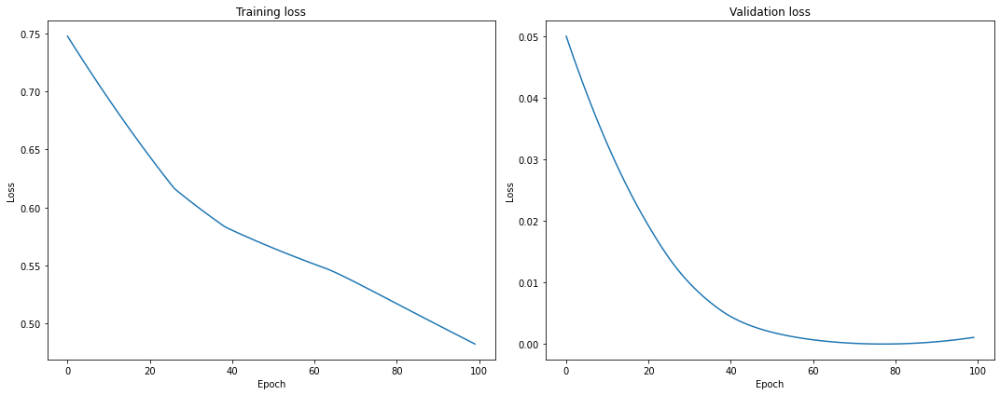

In [14]:
from matplotlib import pyplot as plt

fig, axes = plt.subplots(ncols=2, figsize=(15, 6))

axes[0].plot(history.history['loss'])

axes[0].set(
    title='Training loss',
    ylabel='Loss',
    xlabel='Epoch'
)

axes[1].plot(history.history['val_loss'])

axes[1].set(
    title='Validation loss',
    ylabel='Loss',
    xlabel='Epoch'
)

plt.tight_layout()
plt.show()

In [15]:
for test, ground_truth in zip(x_test, y_test):
    print(f'Input: {test}\tOutput: {mlp.predict(test.reshape(1, 3))[0]}\tExpected: {ground_truth}')

Input: [0 0 1]	Output: [0.11296603]	Expected: 1
Input: [1 0 1]	Output: [0.09422296]	Expected: 0


##  $ f(\vec{x}) = \frac{sin(\pi \cdot \| \vec{x} \|)}{\pi \cdot \| \vec{x} \|} \quad \vec{x} = \begin{bmatrix} x_1 \\ x_2\end{bmatrix} , \|x_1\| \leq 10, \|x_2\| \leq 10$




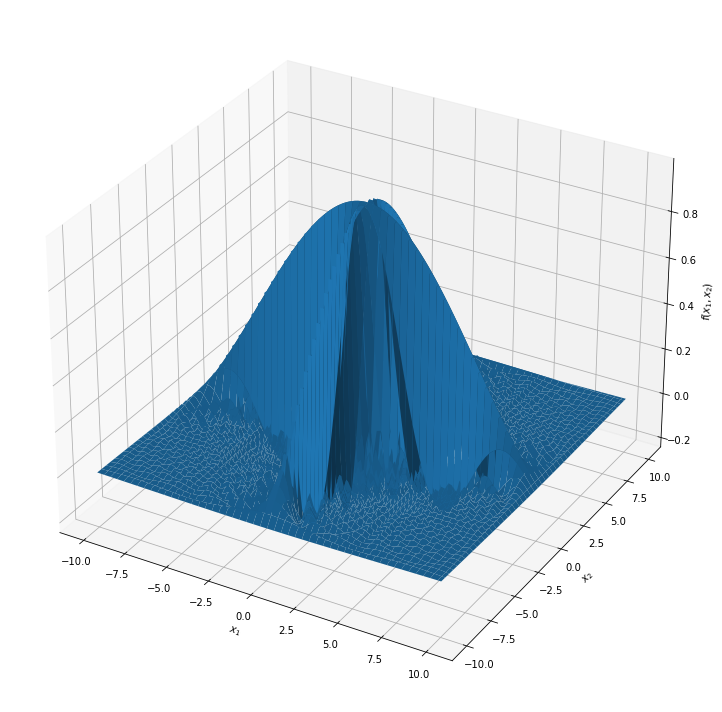

In [71]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20, 10))
ax = fig.gca(projection='3d')

x1, x2 = np.meshgrid(np.linspace(-10, 10, 100), np.linspace(-10, 10, 100))
z = np.sin( np.pi * np.abs(x1) * np.abs(x2) )/(np.pi * np.abs(x1) * np.abs(x2))

ax.plot_surface(x1, x2, z)

ax.set(
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2)$'
)

plt.tight_layout()
plt.show()

x_train, x_test, y_train, y_test = train_test_split(np.vstack([x1.flatten(), x2.flatten()]).T, z.flatten(), test_size=0.2, random_state=505)


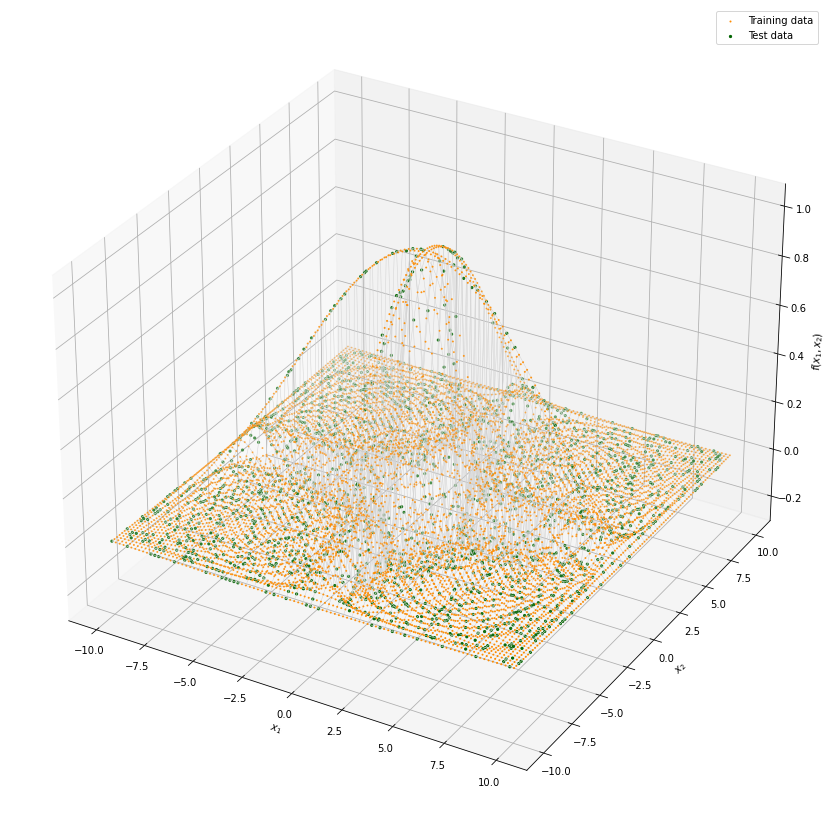

In [70]:
fig = plt.figure(figsize=(25, 15))
ax = fig.gca(projection='3d')

ax.plot_wireframe(x1, x2, z, linewidths=0.5, color='lightgrey')
ax.scatter(x_train[:,0], x_train[:,1], y_train, s=1, color='darkorange', label='Training data')
ax.scatter(x_test[:,0], x_test[:,1], y_test, s=5, color='darkgreen', label='Test data')

ax.set(
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2)$'
)

plt.legend()
plt.show()

In [72]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential

mlp = Sequential([
    Dense(64, activation='relu', input_shape=(2,)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(4, activation='relu'),
    Dense(1, activation='linear')
])

mlp.compile(
    loss='mean_squared_error',
    optimizer='adam'
)

mlp.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 64)                192       
_________________________________________________________________
dense_22 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_23 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_24 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_25 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 5         
Total params: 2,977
Trainable params: 2,977
Non-trainable params: 0
____________________________________________________

In [73]:
history = mlp.fit(
    x_train, y_train,
    epochs=100,
    validation_split=0.1
)

Epoch 1/100
225/225 [==============================] - 1s 2ms/step - loss: 0.0239 - val_loss: 0.0264
Epoch 2/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0242
Epoch 3/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0226
Epoch 4/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0200
Epoch 5/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0182
Epoch 6/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0147 - val_loss: 0.0191
Epoch 7/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0129 - val_loss: 0.0160
Epoch 8/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0120 - val_loss: 0.0142
Epoch 9/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0107
Epoch 10/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0098 - val_lo

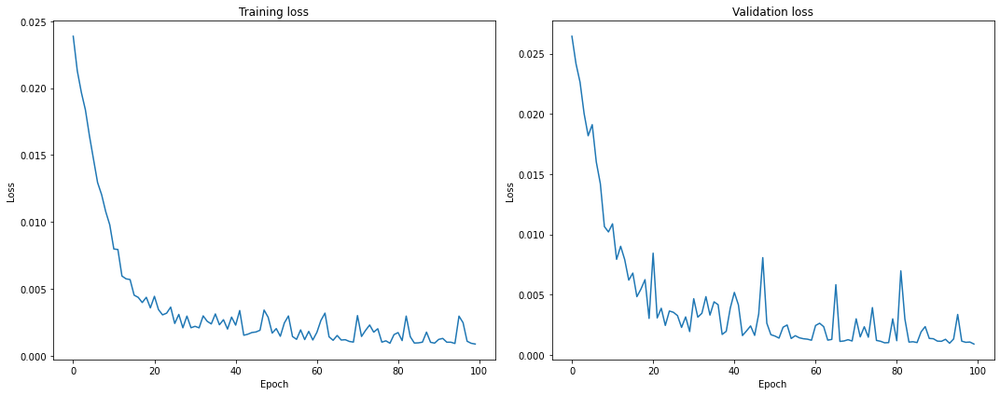

In [74]:
from matplotlib import pyplot as plt

fig, axes = plt.subplots(ncols=2, figsize=(15, 6))

axes[0].plot(history.history['loss'])

axes[0].set(
    title='Training loss',
    ylabel='Loss',
    xlabel='Epoch'
)

axes[1].plot(history.history['val_loss'])

axes[1].set(
    title='Validation loss',
    ylabel='Loss',
    xlabel='Epoch'
)

plt.tight_layout()
plt.show()

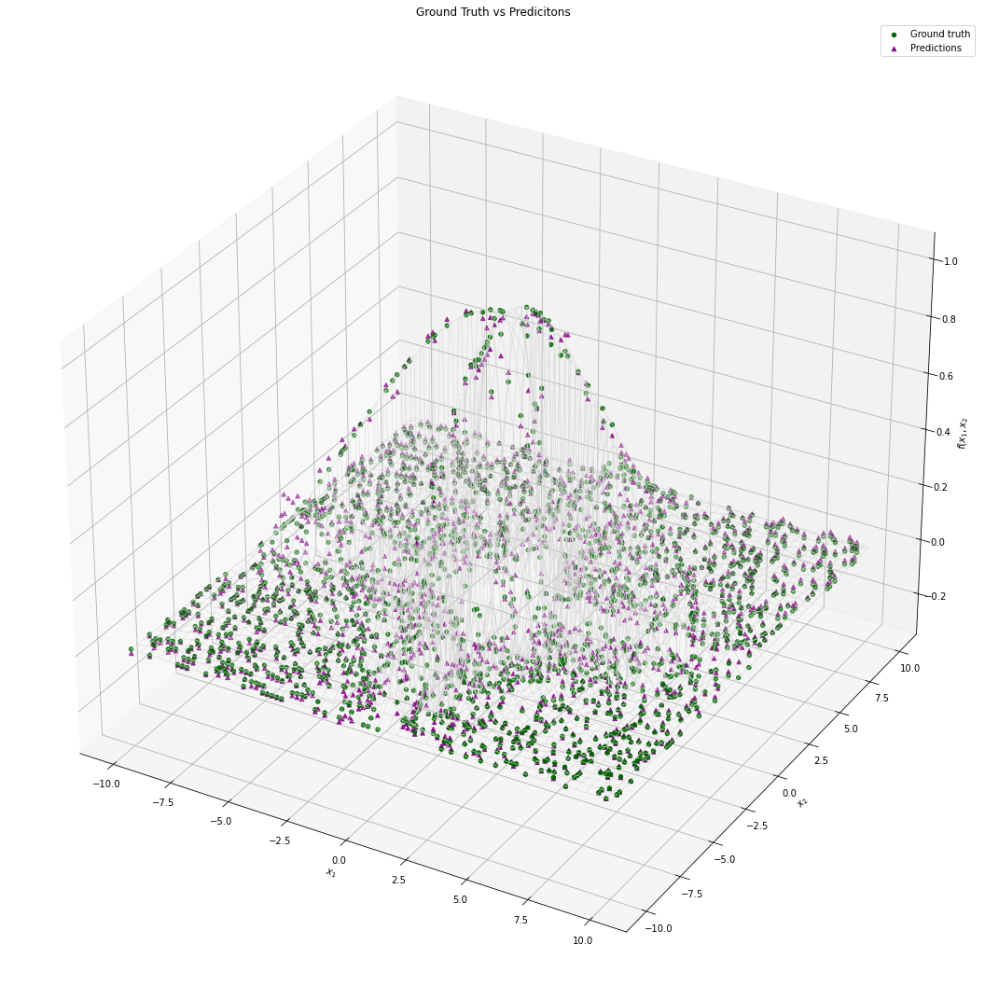

In [76]:
fig = plt.figure(figsize=(20, 15))
ax = fig.gca(projection='3d')

ax.plot_wireframe(x1, x2, z, linewidths=0.5, color='lightgrey')
ax.scatter(x_test[:,0], x_test[:,1], y_test, color='darkgreen', label='Ground truth')
ax.scatter(x_test[:,0], x_test[:,1], mlp.predict(x_test), marker='^', color='purple', label='Predictions')

ax.set(
    title='Ground Truth vs Predicitons',
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2$'
)

plt.legend()
plt.tight_layout()
plt.show()

## $ f(x_1, x_2) = x_1^2 + x_2^2 + 2 x_1 x_2 cos(\pi x_1 x_2) + x_1 + x_2 -1 \quad \|x_1\| \leq 1, \|x_2\| \leq 1 $

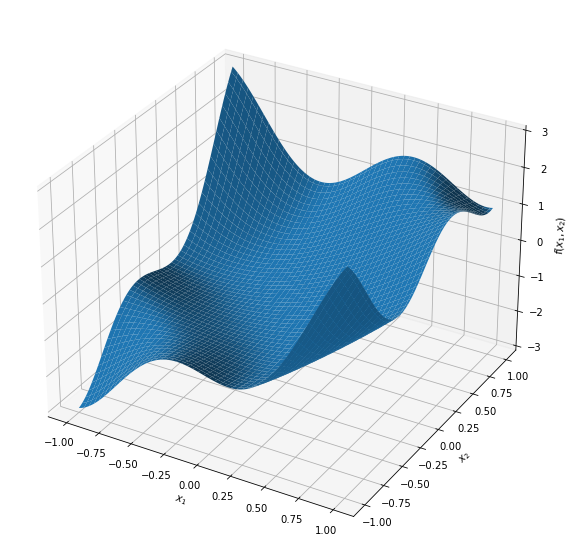

In [60]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20, 10))
ax = fig.gca(projection='3d')

x1, x2 = np.meshgrid(np.linspace(-1, 1, 100), np.linspace(-1, 1, 100))
z =  x1**2 + x2**2 + 2 * x1 * x2 * np.cos(np.pi * x1 * x2) + x1 + x2 - 1

ax.plot_surface(x1, x2, z)

ax.set(
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2)$'
)

plt.show()

x_train, x_test, y_train, y_test = train_test_split(np.vstack([x1.flatten(), x2.flatten()]).T, z.flatten(), test_size=0.2, random_state=505)

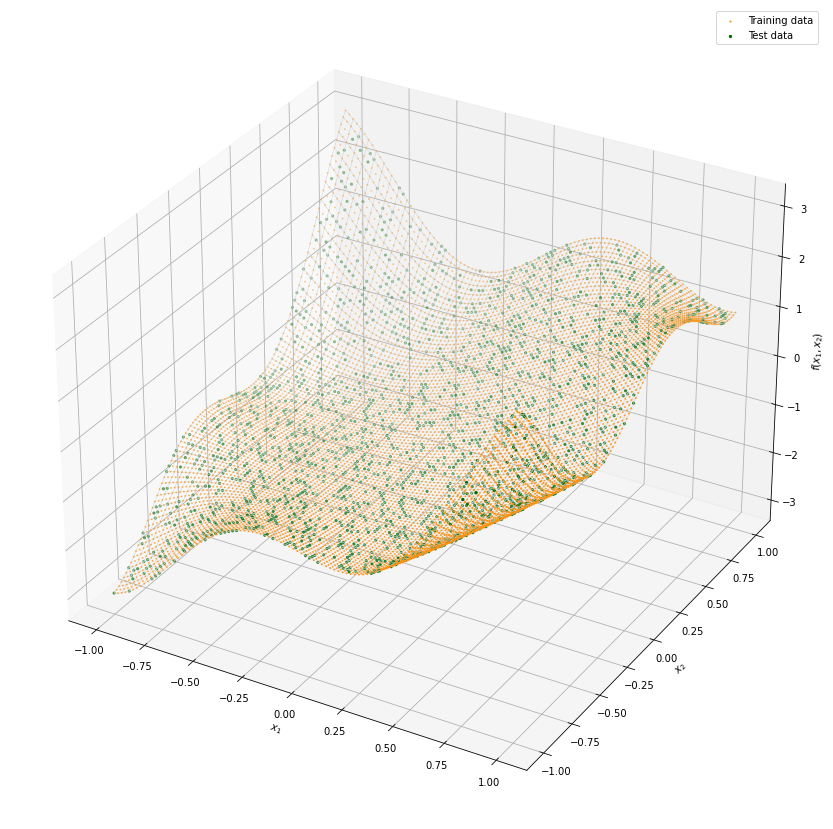

In [33]:
fig = plt.figure(figsize=(25, 15))
ax = fig.gca(projection='3d')

ax.plot_wireframe(x1, x2, z, linewidths=0.5, color='lightgrey')
ax.scatter(x_train[:,0], x_train[:,1], y_train, s=1, color='darkorange', label='Training data')
ax.scatter(x_test[:,0], x_test[:,1], y_test, s=5, color='darkgreen', label='Test data')

ax.set(
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2)$'
)

plt.legend()
plt.show()

In [37]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential

mlp = Sequential([
    Dense(64, activation='relu', input_shape=(2,)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(4, activation='relu'),
    Dense(1, activation='linear')
])

mlp.compile(
    loss='mean_squared_error',
    optimizer='adam'
)

mlp.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 64)                192       
_________________________________________________________________
dense_16 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_17 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_18 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_19 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 5         
Total params: 2,977
Trainable params: 2,977
Non-trainable params: 0
____________________________________________________

In [38]:
history = mlp.fit(
    x_train, y_train,
    epochs=100,
    validation_split=0.1
)

Epoch 1/100
225/225 [==============================] - 0s 2ms/step - loss: 0.2576 - val_loss: 0.0719
Epoch 2/100
225/225 [==============================] - 1s 2ms/step - loss: 0.0484 - val_loss: 0.0398
Epoch 3/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0332 - val_loss: 0.0311
Epoch 4/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0265 - val_loss: 0.0261
Epoch 5/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0213 - val_loss: 0.0227
Epoch 6/100
225/225 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0161
Epoch 7/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0115 - val_loss: 0.0096
Epoch 8/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0069 - val_loss: 0.0067
Epoch 9/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 10/100
225/225 [==============================] - 0s 1ms/step - loss: 0.0065 - val_lo

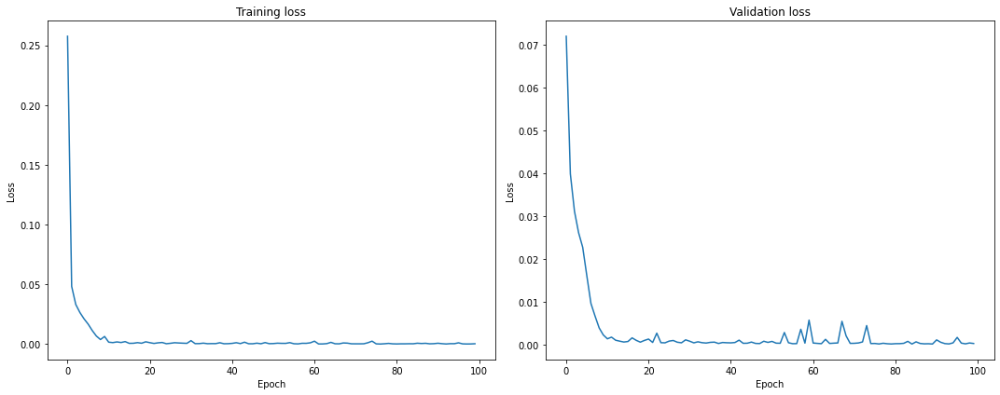

In [39]:
from matplotlib import pyplot as plt

fig, axes = plt.subplots(ncols=2, figsize=(15, 6))

axes[0].plot(history.history['loss'])

axes[0].set(
    title='Training loss',
    ylabel='Loss',
    xlabel='Epoch'
)

axes[1].plot(history.history['val_loss'])

axes[1].set(
    title='Validation loss',
    ylabel='Loss',
    xlabel='Epoch'
)

plt.tight_layout()
plt.show()

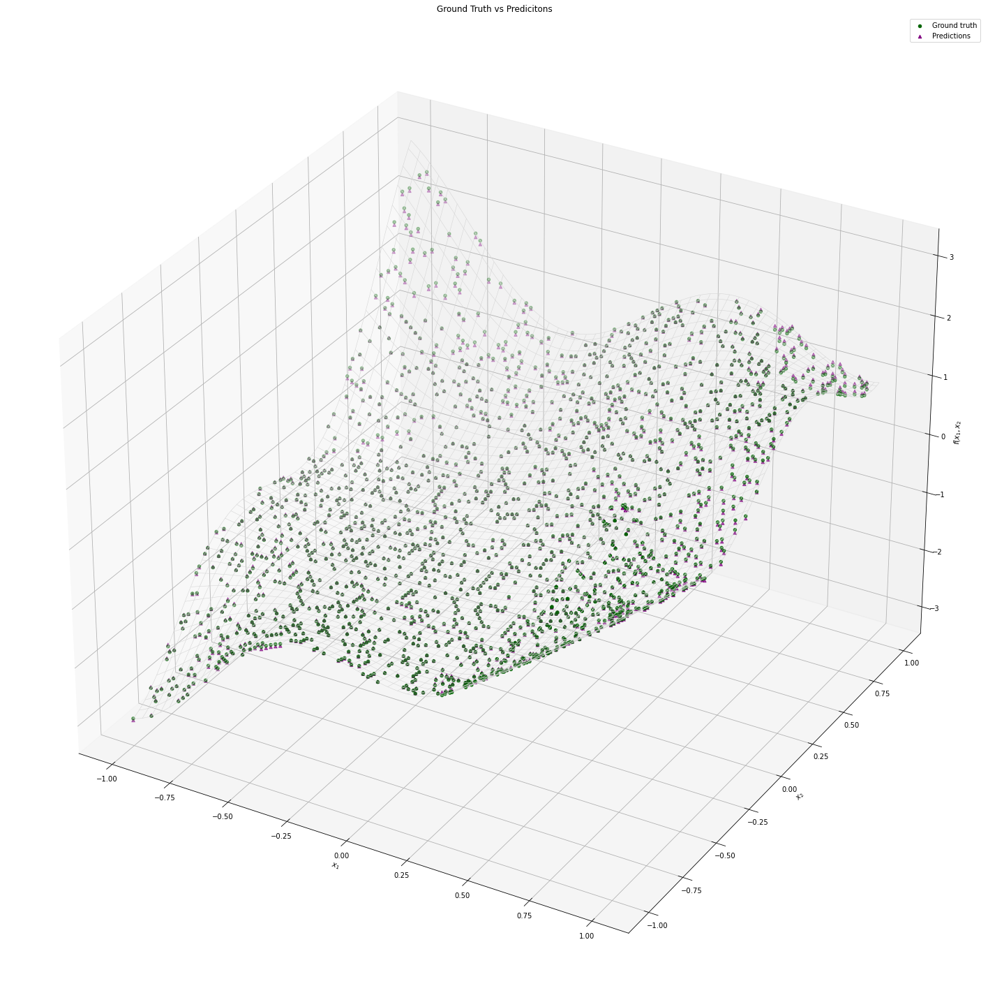

In [48]:
fig = plt.figure(figsize=(25, 20))
ax = fig.gca(projection='3d')

ax.plot_wireframe(x1, x2, z, linewidths=0.5, color='lightgrey')
ax.scatter(x_test[:,0], x_test[:,1], y_test, color='darkgreen', label='Ground truth')
ax.scatter(x_test[:,0], x_test[:,1], mlp.predict(x_test), marker='^', color='purple', label='Predictions')

ax.set(
    title='Ground Truth vs Predicitons',
    xlabel='$x_1$',
    ylabel='$x_2$',
    zlabel='$f(x_1, x_2$'
)

plt.legend()
plt.tight_layout()
plt.show()